In [3]:
import sys
import sktime
import tqdm as tq
import xgboost as xgb
import matplotlib
import seaborn as sns
import sklearn as skl
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series
from xgboost import XGBRegressor
matplotlib.rcParams['font.family'] ='Malgun Gothic'
matplotlib.rcParams['axes.unicode_minus'] =False

In [4]:
train = pd.read_csv('C:/Users/lenovo/aiffel/data/energy/train.csv',encoding='cp949')
## 변수들을 영문명으로 변경
cols = ['num', 'date_time', 'power', 'temp', 'wind','hum' ,'prec', 'sun', 'non_elec', 'solar']
train.columns = cols

# 시간 관련 변수들 생성
date = pd.to_datetime(train.date_time)
train['hour'] = date.dt.hour
train['day'] = date.dt.weekday
train['month'] = date.dt.month
train['week'] = date.dt.weekofyear

#######################################
## 건물별, 요일별, 시간별 발전량 평균 넣어주기
#######################################
power_mean = pd.pivot_table(train, values = 'power', index = ['num', 'hour', 'day'], aggfunc = np.mean).reset_index()
tqdm.pandas()
train['day_hour_mean'] = train.progress_apply(lambda x : power_mean.loc[(power_mean.num == x['num']) & (power_mean.hour == x['hour']) & (power_mean.day == x['day']) ,'power'].values[0], axis = 1)

#######################################
## 건물별 시간별 발전량 평균 넣어주기
#######################################
power_hour_mean = pd.pivot_table(train, values = 'power', index = ['num', 'hour'], aggfunc = np.mean).reset_index()
tqdm.pandas()
train['hour_mean'] = train.progress_apply(lambda x : power_hour_mean.loc[(power_hour_mean.num == x['num']) & (power_hour_mean.hour == x['hour']) ,'power'].values[0], axis = 1)

#######################################
## 건물별 시간별 발전량 표준편차 넣어주기
#######################################
power_hour_std = pd.pivot_table(train, values = 'power', index = ['num', 'hour'], aggfunc = np.std).reset_index()
tqdm.pandas()
train['hour_std'] = train.progress_apply(lambda x : power_hour_std.loc[(power_hour_std.num == x['num']) & (power_hour_std.hour == x['hour']) ,'power'].values[0], axis = 1)

### 공휴일 변수 추가
train['holiday'] = train.apply(lambda x : 0 if x['day']<5 else 1, axis = 1)
train.loc[('2020-08-17'<=train.date_time)&(train.date_time<'2020-08-18'), 'holiday'] = 1

## https://dacon.io/competitions/official/235680/codeshare/2366?page=1&dtype=recent
train['sin_time'] = np.sin(2*np.pi*train.hour/24)
train['cos_time'] = np.cos(2*np.pi*train.hour/24)

## https://dacon.io/competitions/official/235736/codeshare/2743?page=1&dtype=recent
train['THI'] = 9/5*train['temp'] - 0.55*(1-train['hum']/100)*(9/5*train['hum']-26)+32

def CDH(xs):
    ys = []
    for i in range(len(xs)):
        if i < 11:
            ys.append(np.sum(xs[:(i+1)]-26))
        else:
            ys.append(np.sum(xs[(i-11):(i+1)]-26))
    return np.array(ys)

cdhs = np.array([])
for num in range(1,61,1):
    temp = train[train['num'] == num]
    cdh = CDH(temp['temp'].values)
    cdhs = np.concatenate([cdhs, cdh])
train['CDH'] = cdhs

train.drop(['non_elec','solar','hour'], axis = 1, inplace = True)
train.head()

c:\Users\lenovo\Anaconda3\envs\condanote\lib\site-packages\ipykernel_launcher.py:11: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  # This is added back by InteractiveShellApp.init_path()
100%|██████████| 122400/122400 [00:40<00:00, 2995.93it/s]


,num,date_time,power,temp,wind,hum,prec,sun,day,month,week,day_hour_mean,hour_mean,hour_std,holiday,sin_time,cos_time,THI,CDH
0,1,2020-06-01 00,8179.056,17.6,2.5,92.0,0.8,0.0,0,6,23,8528.627077,8540.373176,118.793252,0,0.000000,1.000000,57.5376,-8.4
1,1,2020-06-01 01,8135.640,17.7,2.9,91.0,0.3,0.0,0,6,23,8513.723077,8517.174776,137.989738,0,0.258819,0.965926,57.0389,-16.7
2,1,2020-06-01 02,8107.128,17.5,3.2,91.0,0.0,0.0,0,6,23,8496.625846,8509.055718,122.381197,0,0.500000,0.866025,56.6789,-25.2
3,1,2020-06-01 03,8048.808,17.1,3.2,91.0,0.0,0.0,0,6,23,8480.076923,8493.313129,122.054777,0,0.707107,0.707107,55.9589,-34.1
4,1,2020-06-01 04,8043.624,17.0,3.3,92.0,0.0,0.0,0,6,23,8472.051692,8479.522165,124.472447,0,0.866025,0.500000,56.4576,-43.1


In [6]:
train.to_csv('C:/Users/lenovo/Desktop/AiffelNode/Project/train_preprocessed.csv')

train data shape
x:(1872, 16), y:(1872,)


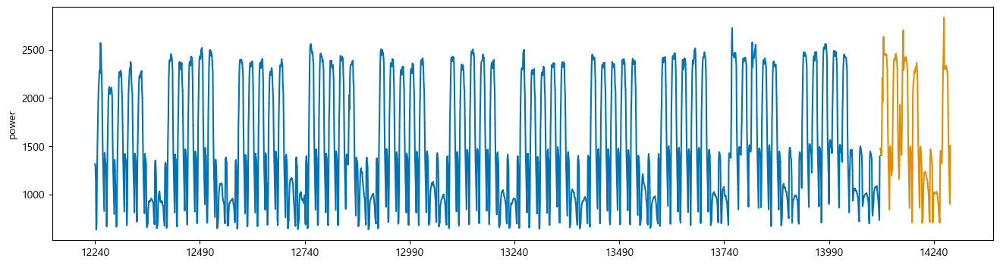

In [7]:
## 7번 건물의 발전량
y = train.loc[train.num == 7, 'power']
x = train.loc[train.num == 7, ].iloc[:, 3:]

y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = y, X = x, test_size = 168) # 24시간*7일 = 168

print('train data shape\nx:{}, y:{}'.format(x_train.shape, y_train.shape))

plot_series(y_train, y_valid, markers=[',' , ','])
plt.show()

In [8]:
def SMAPE(true, pred):
    return np.mean((np.abs(true-pred))/(np.abs(true) + np.abs(pred))) * 100

In [9]:
print("실제값이 100일 때 50으로 underestimate할 때의 SMAPE : {}".format(SMAPE(100, 50)))
print("실제값이 100일 때 150으로 overestimate할 때의 SMAPE : {}".format(SMAPE(100, 150)))

실제값이 100일 때 50으로 underestimate할 때의 SMAPE : 33.33333333333333
실제값이 100일 때 150으로 overestimate할 때의 SMAPE : 20.0


In [10]:
#### alpha를 argument로 받는 함수로 실제 objective function을 wrapping하여 alpha값을 쉽게 조정할 수 있도록 작성했습니다.
# custom objective function for forcing model not to underestimate
def weighted_mse(alpha = 1):
    def weighted_mse_fixed(label, pred):
        residual = (label - pred).astype("float")
        grad = np.where(residual>0, -2*alpha*residual, -2*residual)
        hess = np.where(residual>0, 2*alpha, 2.0)
        return grad, hess
    return weighted_mse_fixed

In [12]:
xgb_params = pd.read_csv('C:/Users/lenovo/aiffel/data/energy/hyperparameter_xgb_final.csv')
xgb_reg = XGBRegressor(n_estimators = 10000, eta = xgb_params.iloc[47,1], min_child_weight = xgb_params.iloc[47,2], 
                       max_depth = xgb_params.iloc[47,3], colsample_bytree = xgb_params.iloc[47,4], 
                       subsample = xgb_params.iloc[47,5], seed=0)

xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_valid, y_valid)],
        early_stopping_rounds=300,
       verbose=False)

c:\Users\lenovo\Anaconda3\envs\condanote\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  UserWarning,


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.8,
             early_stopping_rounds=None, enable_categorical=False, eta=0.01,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.00999999978, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=5, max_leaves=0, min_child_weight=6,
             missing=nan, monotone_constraints='()', n_estimators=10000,
             n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
             reg_alpha=0, ...)

best iterations: 496
SMAPE : 12.770522905024134


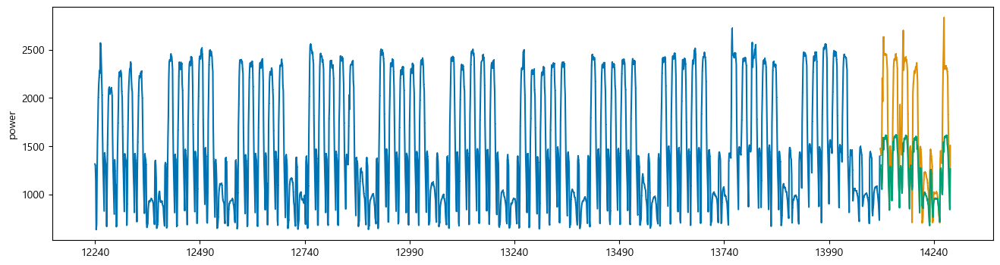

In [13]:
## 주황색이 실제 전력소비량, 초록색이 예측값입니다.
pred = xgb_reg.predict(x_valid)
pred = pd.Series(pred)
pred.index = np.arange(y_valid.index[0], y_valid.index[-1]+1)
plot_series(y_train, y_valid, pd.Series(pred), markers=[',' , ',', ','])

print('best iterations: {}'.format(xgb_reg.best_iteration))
print('SMAPE : {}'.format(SMAPE(y_valid, pred)))

In [18]:
scores = []   # smape 값을 저장할 list
best_it = []  # best interation을 저장할 list
for i in tqdm(range(60)):
    y = train.loc[train.num == i+1, 'power']
    x = train.loc[train.num == i+1, ].iloc[:, 3:]
    y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = y, X = x, test_size = 168)
    
    xgb_reg = XGBRegressor(n_estimators = 10000, eta = 0.01, min_child_weight = xgb_params.iloc[i, 2],
                           max_depth = xgb_params.iloc[i, 3], colsample_bytree = xgb_params.iloc[i, 4], 
                           subsample = xgb_params.iloc[i, 5], seed=0)
    xgb_reg.set_params(**{'objective':weighted_mse(100)}) # alpha = 100으로 고정
    
    xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train), 
                                            (x_valid, y_valid)], early_stopping_rounds=300, verbose=False)
    y_pred = xgb_reg.predict(x_valid)
    pred = pd.Series(y_pred)   
    
    sm = SMAPE(y_valid, y_pred)
    scores.append(sm)
    best_it.append(xgb_reg.best_iteration) ## 실제 best iteration은 이 값에 +1 해주어야 함.

  0%|          | 0/60 [00:00<?, ?it/s]c:\Users\lenovo\Anaconda3\envs\condanote\lib\site-packages\xgboost\sklearn.py:797: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  UserWarning,
100%|██████████| 60/60 [03:05<00:00,  3.09s/it]


In [19]:
alpha_list = []
smape_list = []
for i in tqdm(range(60)):
    y = train.loc[train.num == i+1, 'power']
    x = train.loc[train.num == i+1, ].iloc[:, 3:]
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)
    xgb = XGBRegressor(seed = 0,
                      n_estimators = best_it[i], eta = 0.01, min_child_weight = xgb_params.iloc[i, 2],
                      max_depth = xgb_params.iloc[i, 3], colsample_bytree = xgb_params.iloc[i, 4], subsample = xgb_params.iloc[i, 5])
    
    xgb.fit(x_train, y_train)
    pred0 = xgb.predict(x_test)
    best_alpha = 0
    score0 = SMAPE(y_test,pred0)
    
    for j in [1, 3, 5, 7, 10, 25, 50, 75, 100]:
        xgb = XGBRegressor(seed = 0,
                      n_estimators = best_it[i], eta = 0.01, min_child_weight = xgb_params.iloc[i, 2],
                      max_depth = xgb_params.iloc[i, 3], colsample_bytree = xgb_params.iloc[i, 4], subsample = xgb_params.iloc[i, 5])
        xgb.set_params(**{'objective' : weighted_mse(j)})
    
        xgb.fit(x_train, y_train)
        pred1 = xgb.predict(x_test)
        score1 = SMAPE(y_test, pred1)
        if score1 < score0:
            best_alpha = j
            score0 = score1
    
    alpha_list.append(best_alpha)
    smape_list.append(score0)
    print("building {} || best score : {} || alpha : {}".format(i+1, score0, best_alpha))

  2%|▏         | 1/60 [00:27<26:37, 27.07s/it]

building 1 || best score : 0.14081881739397117 || alpha : 100


  3%|▎         | 2/60 [00:39<17:47, 18.40s/it]

building 2 || best score : 2.682195884240456 || alpha : 100


  5%|▌         | 3/60 [00:59<18:25, 19.39s/it]

building 3 || best score : 0.6688717559558658 || alpha : 1


  7%|▋         | 4/60 [01:13<15:45, 16.89s/it]

building 4 || best score : 8.792995183524397 || alpha : 0


  8%|▊         | 5/60 [01:26<14:23, 15.69s/it]

building 5 || best score : 3.5322403789091497 || alpha : 25


 10%|█         | 6/60 [01:44<14:40, 16.31s/it]

building 6 || best score : 8.145093375054687 || alpha : 100


 12%|█▏        | 7/60 [02:10<17:15, 19.55s/it]

building 7 || best score : 10.928395324006512 || alpha : 75


 13%|█▎        | 8/60 [02:22<14:58, 17.28s/it]

building 8 || best score : 6.74616844399282 || alpha : 100


 15%|█▌        | 9/60 [02:52<17:57, 21.12s/it]

building 9 || best score : 2.321594679962848 || alpha : 25


 17%|█▋        | 10/60 [03:06<15:41, 18.83s/it]

building 10 || best score : 4.462851372313292 || alpha : 75


 18%|█▊        | 11/60 [03:14<12:40, 15.52s/it]

building 11 || best score : 2.1730273015007193 || alpha : 3


 20%|██        | 12/60 [03:26<11:37, 14.53s/it]

building 12 || best score : 2.258418832228727 || alpha : 3


 22%|██▏       | 13/60 [03:39<11:02, 14.10s/it]

building 13 || best score : 2.361603499143115 || alpha : 100


 23%|██▎       | 14/60 [03:53<10:42, 13.97s/it]

building 14 || best score : 1.5336129988985494 || alpha : 0


 25%|██▌       | 15/60 [03:59<08:52, 11.82s/it]

building 15 || best score : 3.2965417966425763 || alpha : 7


 27%|██▋       | 16/60 [04:32<13:10, 17.97s/it]

building 16 || best score : 3.0680538743296903 || alpha : 3


 28%|██▊       | 17/60 [04:53<13:30, 18.84s/it]

building 17 || best score : 8.740442257903636 || alpha : 100


 30%|███       | 18/60 [05:17<14:16, 20.40s/it]

building 18 || best score : 8.946795860728052 || alpha : 0


 32%|███▏      | 19/60 [05:39<14:18, 20.95s/it]

building 19 || best score : 4.2265837545327205 || alpha : 0


 33%|███▎      | 20/60 [05:54<12:44, 19.11s/it]

building 20 || best score : 2.087376682904445 || alpha : 100


 35%|███▌      | 21/60 [06:27<15:16, 23.49s/it]

building 21 || best score : 2.654410123633527 || alpha : 0


 37%|███▋      | 22/60 [06:45<13:48, 21.79s/it]

building 22 || best score : 5.797805558033967 || alpha : 100


 38%|███▊      | 23/60 [07:20<15:55, 25.84s/it]

building 23 || best score : 5.6569368726160825 || alpha : 3


 40%|████      | 24/60 [07:50<16:08, 26.90s/it]

building 24 || best score : 1.360441071988419 || alpha : 100


 42%|████▏     | 25/60 [08:03<13:14, 22.69s/it]

building 25 || best score : 3.8405360778654076 || alpha : 100


 43%|████▎     | 26/60 [08:16<11:17, 19.91s/it]

building 26 || best score : 3.2135532170254653 || alpha : 75


 45%|████▌     | 27/60 [08:25<09:10, 16.67s/it]

building 27 || best score : 6.830400161393392 || alpha : 100


 47%|████▋     | 28/60 [08:34<07:40, 14.39s/it]

building 28 || best score : 1.874738237030053 || alpha : 75


 48%|████▊     | 29/60 [08:42<06:21, 12.29s/it]

building 29 || best score : 2.339185256670576 || alpha : 3


 50%|█████     | 30/60 [08:50<05:32, 11.09s/it]

building 30 || best score : 2.969260172349088 || alpha : 10


 52%|█████▏    | 31/60 [09:15<07:25, 15.35s/it]

building 31 || best score : 0.40733799466179377 || alpha : 100


 53%|█████▎    | 32/60 [09:36<07:53, 16.92s/it]

building 32 || best score : 0.19712355855555258 || alpha : 50


 55%|█████▌    | 33/60 [10:10<09:56, 22.10s/it]

building 33 || best score : 0.9105867420783845 || alpha : 5


 57%|█████▋    | 34/60 [10:16<07:28, 17.27s/it]

building 34 || best score : 3.9267770034522025 || alpha : 25


 58%|█████▊    | 35/60 [10:37<07:37, 18.30s/it]

building 35 || best score : 11.234351162638124 || alpha : 100


 60%|██████    | 36/60 [10:55<07:18, 18.26s/it]

building 36 || best score : 2.458947268850197 || alpha : 75


 62%|██████▏   | 37/60 [11:22<07:58, 20.79s/it]

building 37 || best score : 5.989080528917346 || alpha : 50


 63%|██████▎   | 38/60 [11:39<07:18, 19.93s/it]

building 38 || best score : 1.5342876463801522 || alpha : 100


 65%|██████▌   | 39/60 [12:40<11:13, 32.08s/it]

building 39 || best score : 3.1584758288692303 || alpha : 10


 67%|██████▋   | 40/60 [12:55<08:59, 26.96s/it]

building 40 || best score : 5.500989344187065 || alpha : 1


 68%|██████▊   | 41/60 [13:07<07:05, 22.41s/it]

building 41 || best score : 3.81965534444065 || alpha : 10


 70%|███████   | 42/60 [13:16<05:31, 18.40s/it]

building 42 || best score : 4.495863570579937 || alpha : 10


 72%|███████▏  | 43/60 [13:27<04:38, 16.38s/it]

building 43 || best score : 3.130589041019399 || alpha : 75


 73%|███████▎  | 44/60 [13:57<05:25, 20.36s/it]

building 44 || best score : 2.718625212107266 || alpha : 0


 75%|███████▌  | 45/60 [14:15<04:53, 19.58s/it]

building 45 || best score : 2.1456780570379688 || alpha : 7


 77%|███████▋  | 46/60 [14:43<05:09, 22.10s/it]

building 46 || best score : 6.307464245521493 || alpha : 0


 78%|███████▊  | 47/60 [15:06<04:51, 22.40s/it]

building 47 || best score : 5.399976937599268 || alpha : 100


 80%|████████  | 48/60 [15:21<04:01, 20.15s/it]

building 48 || best score : 14.001549105413241 || alpha : 100


 82%|████████▏ | 49/60 [15:37<03:29, 19.06s/it]

building 49 || best score : 2.815847669160997 || alpha : 100


 83%|████████▎ | 50/60 [15:53<02:59, 17.96s/it]

building 50 || best score : 2.33335279221055 || alpha : 25


 85%|████████▌ | 51/60 [16:16<02:55, 19.49s/it]

building 51 || best score : 1.88473197199545 || alpha : 100


 87%|████████▋ | 52/60 [16:31<02:24, 18.05s/it]

building 52 || best score : 3.1667451531609716 || alpha : 100


 88%|████████▊ | 53/60 [16:48<02:04, 17.76s/it]

building 53 || best score : 5.267101620914497 || alpha : 100


 90%|█████████ | 54/60 [17:04<01:44, 17.34s/it]

building 54 || best score : 3.190060997851221 || alpha : 100


 92%|█████████▏| 55/60 [17:17<01:20, 16.16s/it]

building 55 || best score : 2.7096980574883553 || alpha : 100


 93%|█████████▎| 56/60 [17:29<00:59, 14.94s/it]

building 56 || best score : 4.961832651889552 || alpha : 100


 95%|█████████▌| 57/60 [17:50<00:49, 16.51s/it]

building 57 || best score : 7.171788461209146 || alpha : 100


 97%|█████████▋| 58/60 [17:59<00:29, 14.51s/it]

building 58 || best score : 2.4926409092603654 || alpha : 100


 98%|█████████▊| 59/60 [18:05<00:11, 11.82s/it]

building 59 || best score : 5.739513103166726 || alpha : 3


100%|██████████| 60/60 [18:17<00:00, 18.29s/it]

building 60 || best score : 1.7586636289388808 || alpha : 3


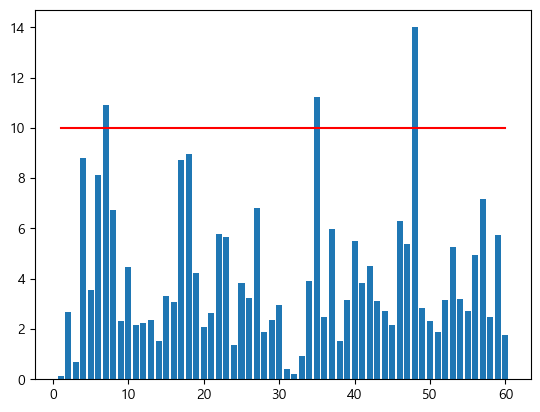

In [20]:
no_df = pd.DataFrame({'score':smape_list})
plt.bar(np.arange(len(no_df))+1, no_df['score'])
plt.plot([1,60], [10, 10], color = 'red')

In [22]:
# train set과 동일한 전처리 과정
test = pd.read_csv('C:/Users/lenovo/Desktop/AiffelNode/Project/test.csv', encoding = 'cp949')
cols = ['num', 'date_time', 'temp', 'wind','hum' ,'prec', 'sun', 'non_elec', 'solar']
test.columns = cols
date = pd.to_datetime(test.date_time)
test['hour'] = date.dt.hour
test['day'] = date.dt.weekday
test['month'] = date.dt.month
test['week'] = date.dt.weekofyear
test['sin_time'] = np.sin(2*np.pi*test.hour/24)
test['cos_time'] = np.cos(2*np.pi*test.hour/24)
test['holiday'] = test.apply(lambda x : 0 if x['day']<5 else 1, axis = 1)
test.loc[('2020-08-17'<=test.date_time)&(test.date_time<'2020-08-18'), 'holiday'] = 1

## 건물별 일별 시간별 발전량 평균
tqdm.pandas()
test['day_hour_mean'] = test.progress_apply(lambda x : power_mean.loc[(power_mean.num == x['num']) & (power_mean.day == x['day']) & (power_mean.hour == x['hour']) ,'power'].values[0], axis = 1)

## 건물별 시간별 발전량 평균 넣어주기
tqdm.pandas()
test['hour_mean'] = test.progress_apply(lambda x : power_hour_mean.loc[(power_hour_mean.num == x['num']) & (power_hour_mean.hour == x['hour']) ,'power'].values[0], axis = 1)

tqdm.pandas()
test['hour_std'] = test.progress_apply(lambda x : power_hour_std.loc[(power_hour_std.num == x['num']) & (power_hour_std.hour == x['hour']) ,'power'].values[0], axis = 1)

test.drop(['non_elec', 'solar','hour','date_time'], axis = 1, inplace = True)

# pandas 내 선형보간 method 사용
for i in range(60):
    test.iloc[i*168:(i+1)*168, :]  = test.iloc[i*168:(i+1)*168, :].interpolate()


test['THI'] = 9/5*test['temp'] - 0.55*(1-test['hum']/100)*(9/5*test['hum']-26)+32

cdhs = np.array([])
for num in range(1,61,1):
    temp = test[test['num'] == num]
    cdh = CDH(temp['temp'].values)
    cdhs = np.concatenate([cdhs, cdh])
test['CDH'] = cdhs

test = test[['num','temp', 'wind', 'hum', 'prec', 'sun', 'day', 'month', 'week',
       'day_hour_mean', 'hour_mean', 'hour_std', 'holiday', 'sin_time',
       'cos_time', 'THI', 'CDH']]
test.head()

c:\Users\lenovo\Anaconda3\envs\condanote\lib\site-packages\ipykernel_launcher.py:9: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  if __name__ == "__main__":
100%|██████████| 10080/10080 [00:03<00:00, 3250.45it/s]


,num,temp,wind,hum,prec,sun,day,month,week,day_hour_mean,hour_mean,hour_std,holiday,sin_time,cos_time,THI,CDH
0,1,27.800000,1.500000,74.000000,0.0,0.0,1,8,35,8505.972,8540.373176,118.793252,0,0.000000,1.000000,66.710400,1.800000
1,1,27.633333,1.366667,75.333333,0.0,0.0,1,8,35,8442.414,8517.174776,137.989738,0,0.258819,0.965926,66.870933,3.433333
2,1,27.466667,1.233333,76.666667,0.0,0.0,1,8,35,8475.948,8509.055718,122.381197,0,0.500000,0.866025,67.066667,4.900000
3,1,27.300000,1.100000,78.000000,0.0,0.0,1,8,35,8444.844,8493.313129,122.054777,0,0.707107,0.707107,67.297600,6.200000
4,1,26.900000,1.166667,79.666667,0.0,0.0,1,8,35,8425.242,8479.522165,124.472447,0,0.866025,0.500000,67.290767,7.100000


In [23]:
xgb_params['alpha'] = alpha_list
xgb_params['best_it'] = best_it
xgb_params.head()

,n_estimators,eta,min_child_weight,max_depth,colsample_bytree,subsample,alpha,best_it
0,100,0.01,4,5,0.8,0.8,100,1051
1,100,0.01,6,3,0.8,0.9,100,534
2,100,0.01,6,7,0.9,0.9,1,637
3,100,0.01,3,7,0.8,0.9,0,379
4,100,0.01,2,6,0.9,0.9,25,447


In [24]:
xgb_params.to_csv('C:/Users/lenovo/Desktop/AiffelNode/Project/hyperparameter_xgb_final2.csv', index=False)

In [25]:
xgb_params = pd.read_csv('C:/Users/lenovo/Desktop/AiffelNode/Project/hyperparameter_xgb_final2.csv')
xgb_params.head()

,n_estimators,eta,min_child_weight,max_depth,colsample_bytree,subsample,alpha,best_it
0,100,0.01,4,5,0.8,0.8,100,1051
1,100,0.01,6,3,0.8,0.9,100,534
2,100,0.01,6,7,0.9,0.9,1,637
3,100,0.01,3,7,0.8,0.9,0,379
4,100,0.01,2,6,0.9,0.9,25,447


In [26]:
best_it = xgb_params['best_it'].to_list()
best_it[0]        # 1051

1051

In [27]:
preds = np.array([]) 
for i in tqdm(range(60)):
    
    pred_df = pd.DataFrame()   # 시드별 예측값을 담을 data frame
    
    for seed in [0,1,2,3,4,5]: # 각 시드별 예측
        y_train = train.loc[train.num == i+1, 'power']
        x_train, x_test = train.loc[train.num == i+1, ].iloc[:, 3:], test.loc[test.num == i+1, ].iloc[:,1:]
        x_test = x_test[x_train.columns]
        
        xgb = XGBRegressor(seed = seed, n_estimators = best_it[i], eta = 0.01, 
                           min_child_weight = xgb_params.iloc[i, 2], max_depth = xgb_params.iloc[i, 3], 
                           colsample_bytree=xgb_params.iloc[i, 4], subsample=xgb_params.iloc[i, 5])
    
        if xgb_params.iloc[i,6] != 0:  # 만약 alpha가 0이 아니면 weighted_mse 사용
            xgb.set_params(**{'objective':weighted_mse(xgb_params.iloc[i,6])})
        
        xgb.fit(x_train, y_train)
        y_pred = xgb.predict(x_test)
        pred_df.loc[:,seed] = y_pred   # 각 시드별 예측 담기
        
    pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 시드별 예측 평균값
    preds = np.append(preds, pred)   

100%|██████████| 60/60 [10:25<00:00, 10.42s/it]


In [28]:
preds = pd.Series(preds)

fig, ax = plt.subplots(60, 1, figsize=(100,200), sharex = True)
ax = ax.flatten()
for i in range(60):
    train_y = train.loc[train.num == i+1, 'power'].reset_index(drop = True)
    test_y = preds[i*168:(i+1)*168]
    ax[i].scatter(np.arange(2040) , train.loc[train.num == i+1, 'power'])
    ax[i].scatter(np.arange(2040, 2040+168) , test_y)
    ax[i].tick_params(axis='both', which='major', labelsize=6)
    ax[i].tick_params(axis='both', which='minor', labelsize=4)
#plt.savefig('./predict_xgb.png')
plt.show()

In [29]:
submission = pd.read_csv('C:/Users/lenovo/Desktop/AiffelNode/Project/sample_submission.csv')
submission['answer'] = preds
submission.to_csv('C:/Users/lenovo/Desktop/AiffelNode/Project/submission_xgb_noclip.csv', index = False)

In [30]:
train_to_post = pd.read_csv('C:/Users/lenovo/Desktop/AiffelNode/Project/train.csv', encoding = 'cp949')
cols = ['num', 'date_time', 'power', 'temp', 'wind','hum' ,'prec', 'sun', 'non_elec', 'solar']
train_to_post.columns = cols
date = pd.to_datetime(train_to_post.date_time)
train_to_post['hour'] = date.dt.hour
train_to_post['day'] = date.dt.weekday
train_to_post['month'] = date.dt.month
train_to_post['week'] = date.dt.weekofyear
train_to_post = train_to_post.loc[(('2020-08-17'>train_to_post.date_time)|(train_to_post.date_time>='2020-08-18')), ].reset_index(drop = True)

pred_clip = []
test_to_post = pd.read_csv('C:/Users/lenovo/Desktop/AiffelNode/Project/test.csv',  encoding = 'cp949')
cols = ['num', 'date_time', 'temp', 'wind','hum' ,'prec', 'sun', 'non_elec', 'solar']
test_to_post.columns = cols
date = pd.to_datetime(test_to_post.date_time)
test_to_post['hour'] = date.dt.hour
test_to_post['day'] = date.dt.weekday
test_to_post['month'] = date.dt.month
test_to_post['week'] = date.dt.weekofyear

## submission 불러오기
df = pd.read_csv('C:/Users/lenovo/Desktop/AiffelNode/Project/submission_xgb_noclip.csv')
for i in range(60):
    min_data = train_to_post.loc[train_to_post.num == i+1, ].iloc[-28*24:, :] ## 건물별로 직전 28일의 데이터 불러오기
    ## 요일별, 시간대별 최솟값 계산
    min_data = pd.pivot_table(min_data, values = 'power', index = ['day', 'hour'], aggfunc = min).reset_index() 
    pred = df.answer[168*i:168*(i+1)].reset_index(drop=True) ## 168개 데이터, 즉 건물별 예측값 불러오기
    day =  test_to_post.day[168*i:168*(i+1)].reset_index(drop=True) ## 예측값 요일 불러오기
    hour = test_to_post.hour[168*i:168*(i+1)].reset_index(drop=True) ## 예측값 시간 불러오기
    df_pred = pd.concat([pred, day, hour], axis = 1)
    df_pred.columns = ['pred', 'day', 'hour']
    for j in range(len(df_pred)):
        min_power = min_data.loc[(min_data.day == df_pred.day[j])&(min_data.hour == df_pred.hour[j]), 'power'].values[0]
        if df_pred.pred[j] < min_power:
            pred_clip.append(min_power)
        else:
            pred_clip.append(df_pred.pred[j])

c:\Users\lenovo\Anaconda3\envs\condanote\lib\site-packages\ipykernel_launcher.py:8: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  
c:\Users\lenovo\Anaconda3\envs\condanote\lib\site-packages\ipykernel_launcher.py:19: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.


c:\Users\lenovo\Anaconda3\envs\condanote\lib\site-packages\sktime\utils\plotting.py:110: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, figsize=plt.figaspect(0.25))


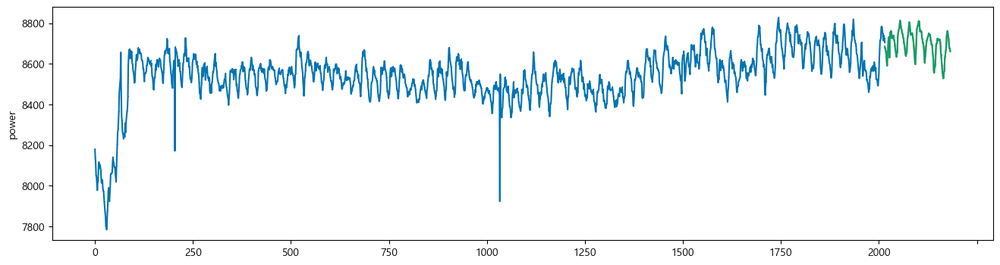

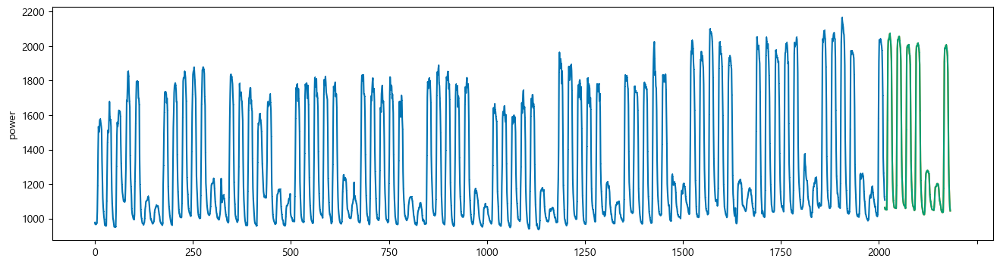

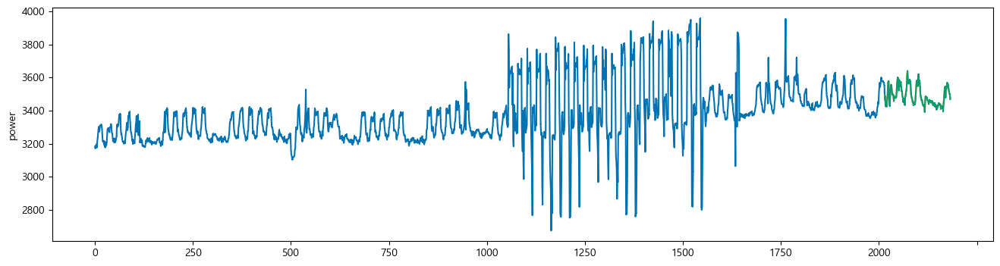

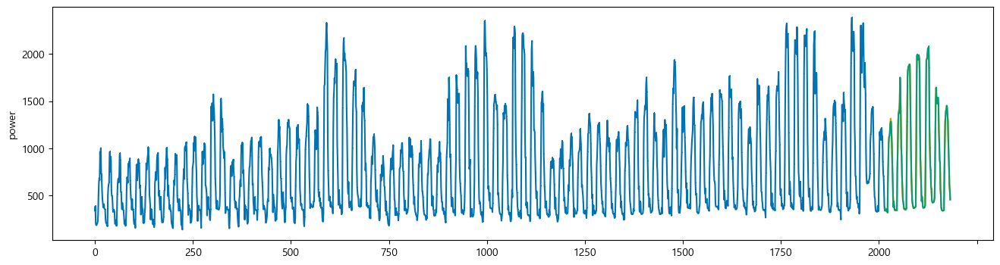

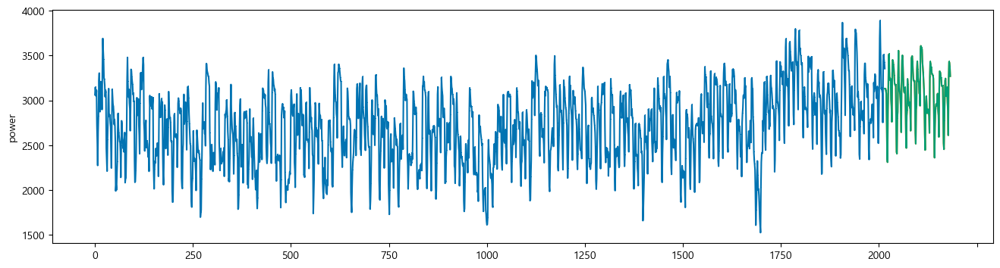

...

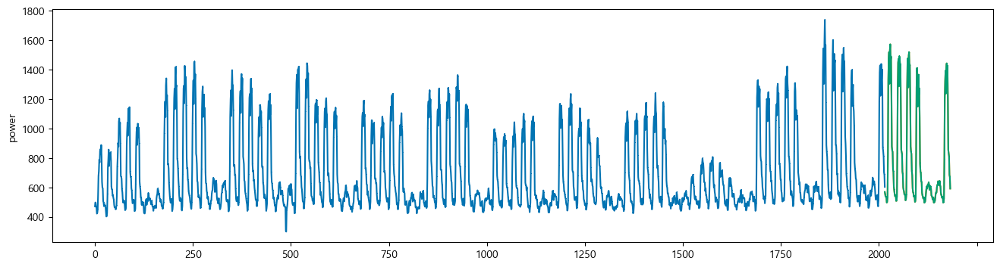

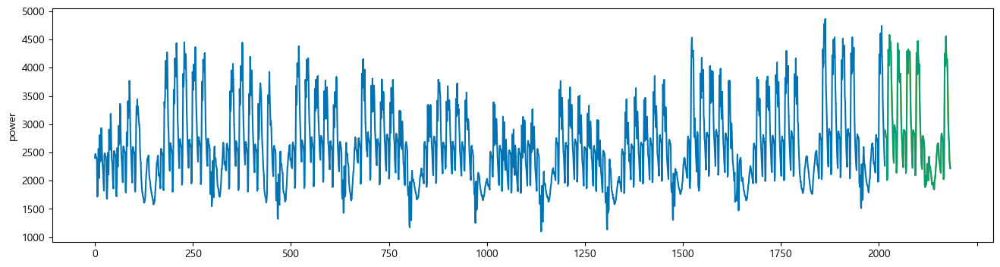

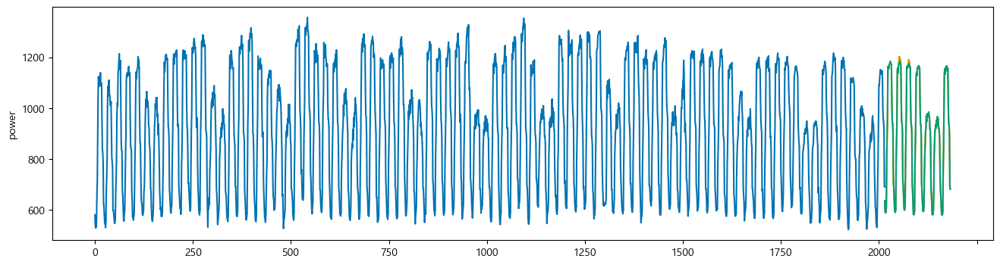

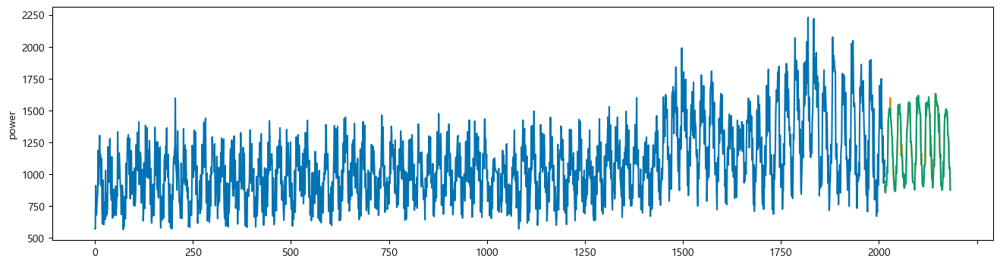

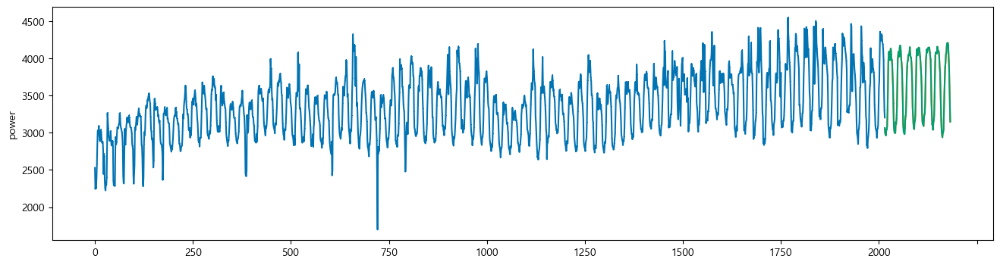

In [31]:
pred_origin = df.answer
pred_clip = pd.Series(pred_clip)

for i in range(60):
    power = train_to_post.loc[train_to_post.num == i+1, 'power'].reset_index(drop=True)
    preds = pred_clip[i*168:(i+1)*168]
    preds_origin = pred_origin[i*168:(i+1)*168]
    preds.index = range(power.index[-1], power.index[-1]+168)
    preds_origin.index = range(power.index[-1], power.index[-1]+168)
    
    plot_series(power, preds,  preds_origin, markers = [',', ',', ','])

In [ ]:
submission = pd.read_csv('C:/Users/lenovo/Desktop/AiffelNode/Project/sample_submission.csv')
submission['answer'] = pred_clip
submission.to_csv('C:/Users/lenovo/Desktop/AiffelNode/Project/submission_xgb_final.csv', index = False)